## ICE-6 Color features and histogram
Please download the following images for the ICE-6:<br>
https://drive.google.com/file/d/136KacYJQZ3ShMSDndqgzohTlTPrfKuma/view?usp=sharing

In [1]:
from google.colab import drive


## (Tutorial) Dominant colors
Please refer to the following link to learn how to extract dominant colors of a given image:<br>
https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/

## Example 1. Extracting dominant colors

In [2]:
!pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# libraries to implent the task

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import argparse
import utils
import cv2

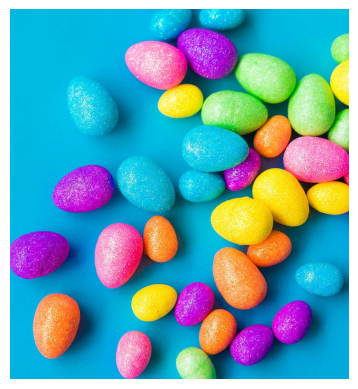

In [4]:
# load the image and convert it from BGR to RGB so that
# we can dispaly it with matplotlib
image = cv2.imread("eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)

In [5]:
# reshape the image to proper version for the following processing
image = image.reshape((image.shape[0] * image.shape[1], 3))

In [6]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 10)
clt.fit(image)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=10)

In [7]:
# import the necessary packages
import numpy as np
import cv2
def centroid_histogram(clt):
# grab the number of different clusters and create a histogram
# based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
# normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
# return the histogram
    return hist

In [8]:
def plot_colors(hist, centroids):
# initialize the bar chart representing the relative frequency
# of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
# loop over the percentage of each cluster and the color of
# each cluster
    for (percent, color) in zip(hist, centroids):
# plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

# return the bar chart
    return bar

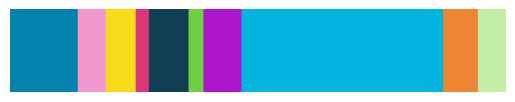

In [9]:
# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## (Tutorial) Within-Cluster Sum of Square (wcss) and Elbow method
Please refer to the following link to learn Elbow method for optimal number of clusters selecting:<br>
https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/

## Task 1. Using the Elbow method to select the optimal number of clusters for the three images in your downloaded zip file
1. Selecting the optimal number of clusters using Elbow method
2. Visualizing the histogram of clusters as shown in example 1 with the optimal number of clusters

In [31]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [33]:
# eggs image clustering
eggsimg = cv2.imread("eggs.jpg")
image = cv2.cvtColor(eggsimg, cv2.COLOR_BGR2RGB)
# reshape the image to proper version for the following processing
image1 = image.reshape((image.shape[0] * image.shape[1], 3))

In [34]:
# boy image clustering
boyimg = cv2.imread("boy.jpg")
image = cv2.cvtColor(boyimg, cv2.COLOR_BGR2RGB)
# reshape the image to proper version for the following processing
image2 = image.reshape((image.shape[0] * image.shape[1], 3))

In [35]:
# nepal image clustering
nepalimg = cv2.imread("Nepal.jpg")
image = cv2.cvtColor(nepalimg, cv2.COLOR_BGR2RGB)
# reshape the image to proper version for the following processing
image3 = image.reshape((image.shape[0] * image.shape[1], 3))

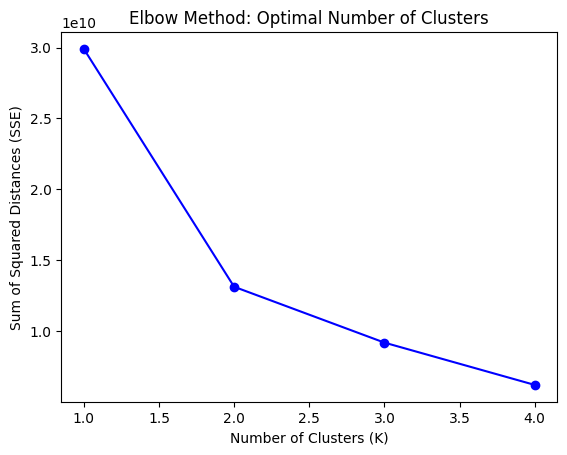

In [36]:
squaredvals = []
clusters = range(1, 5)
for k in clusters:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(image1)
    squaredvals.append(kmeans.inertia_)

# values against number of clusters
plt.plot(clusters, squaredvals, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method: Optimal Number of Clusters')
plt.show()

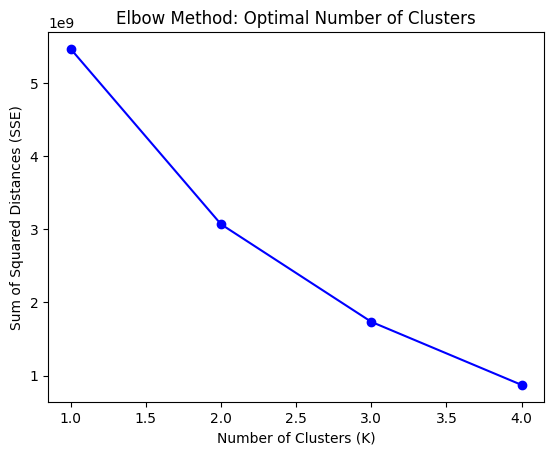

In [37]:
squaredvals = []
clusters = range(1, 5)
for k in clusters:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(image2)
    squaredvals.append(kmeans.inertia_)

# values against number of clusters
plt.plot(clusters, squaredvals, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method: Optimal Number of Clusters')
plt.show()

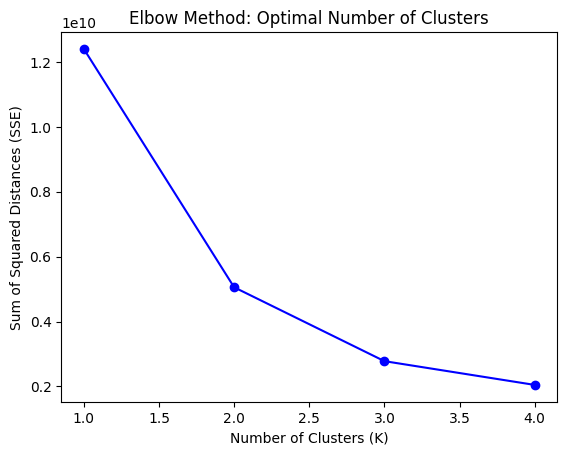

In [39]:
squaredvals = []
clusters = range(1, 5)
for k in clusters:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(image3)
    squaredvals.append(kmeans.inertia_)

# values against number of clusters
plt.plot(clusters, squaredvals, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method: Optimal Number of Clusters')
plt.show()

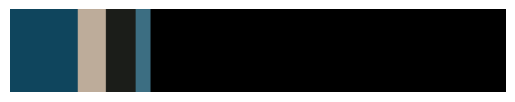

In [40]:
hist = centroid_histogram(clt)
bar = plot_colors(hist, kmeans.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## Question 1. According to the Elbow method, how to choose the optimal number of clusters?

**Answer to Q1**:
Choosing the optimal number of clusters as follows
1. Reading the data and reshaping the data to apply the kmeans clustering method.
2. fitting the kmeans clustering to the data
3. calculating sum of squared distance which is closer to cluster centroid.
4. Creating elbow graph to determine the number of clusters
5. In the above examples number of clusters are 2 using elbow point.


---

## (Tutorial) Histogram Equalization
Please refer to the following link to learn the histogram equalization:<br>
https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 <br> and
https://hypjudy.github.io/2017/03/19/dip-histogram-equalization/

## Example 2. Histogram equalization on gray image

Original Image


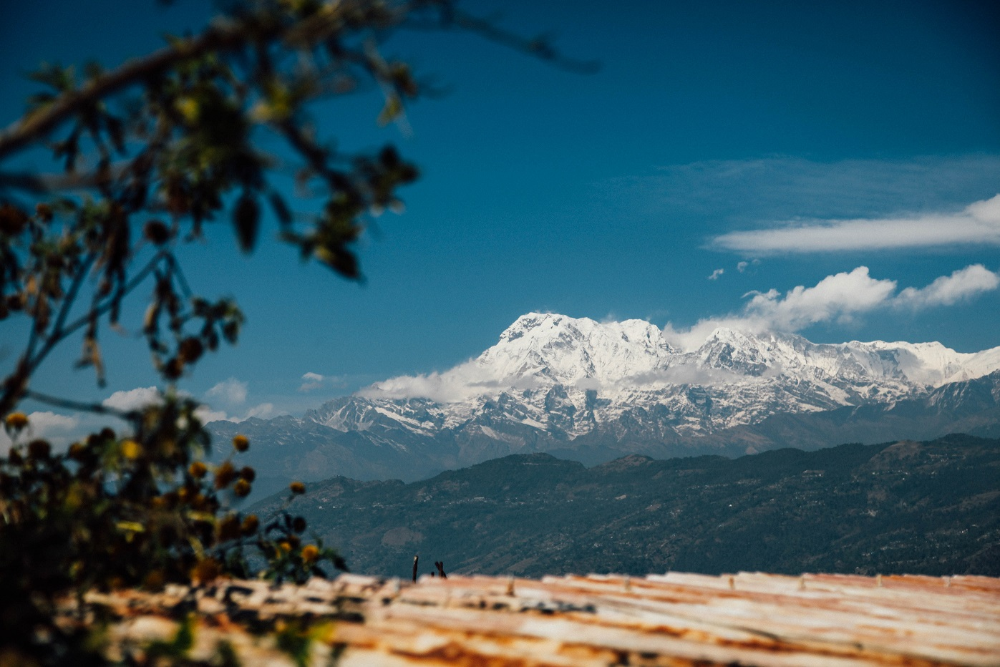

Gray Image


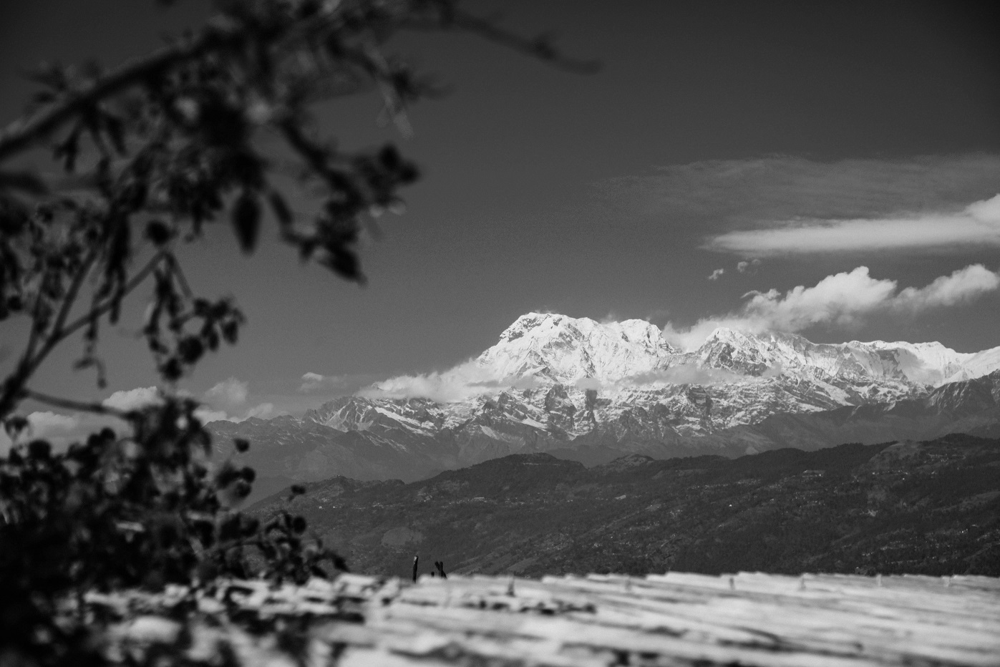

In [10]:
from google.colab.patches import cv2_imshow

img = cv2.imread('Nepal.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
print("Gray Image")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

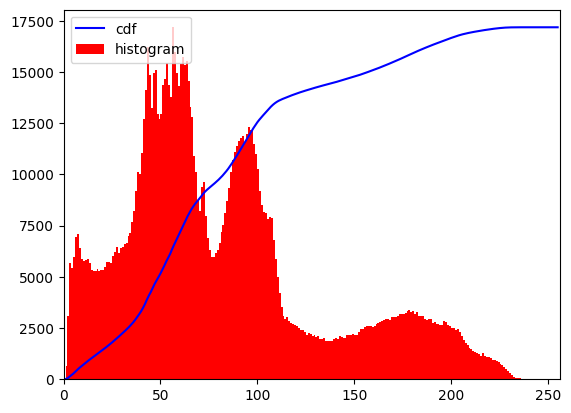

In [11]:
hist,bins = np.histogram(gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

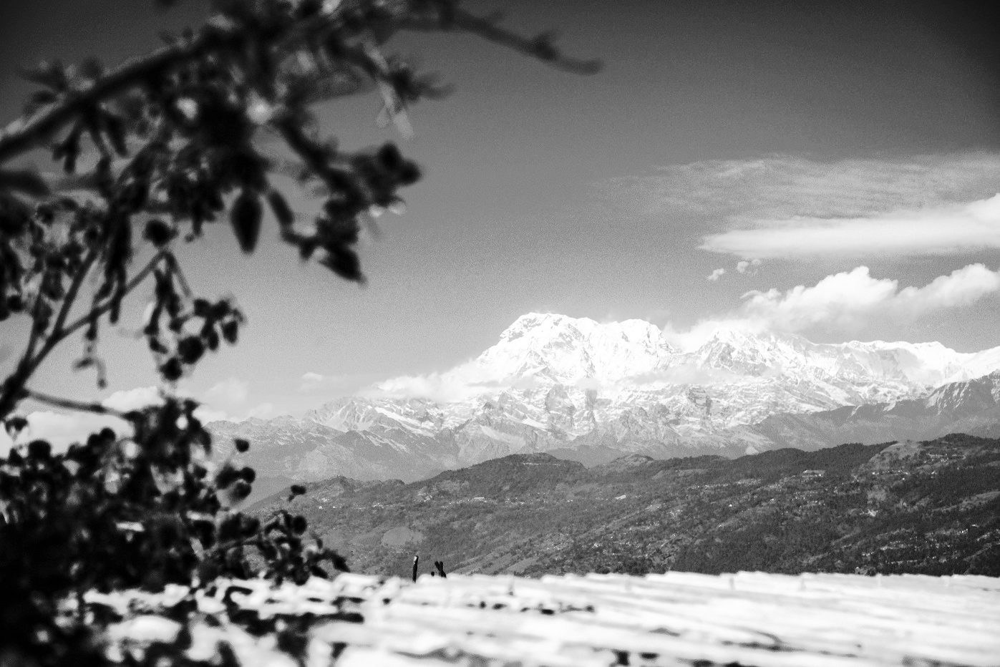

In [12]:
equ = cv2.equalizeHist(gray)
cv2_imshow(equ)
cv2.waitKey(0)
cv2.destroyAllWindows()

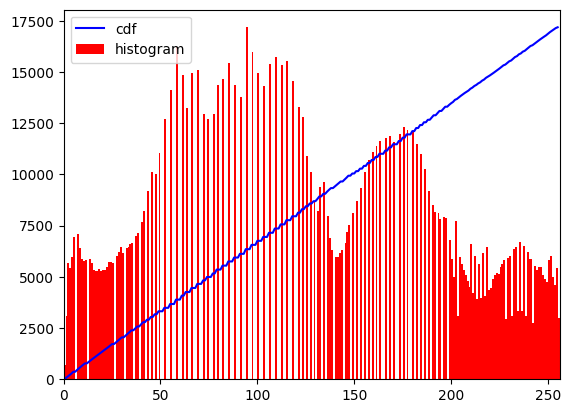

In [13]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()



```
# This is formatted as code
```

## Task 2. Histogram equalization on color images
1. Apply histogram equalization on the 3 downloaded images
2. Visualize the histograms and the cumulative summation before and after histogram equalization
3. Show the images before and after histogram equalization

In [14]:
# libraries to implent equalization
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

### Nepal jpg file

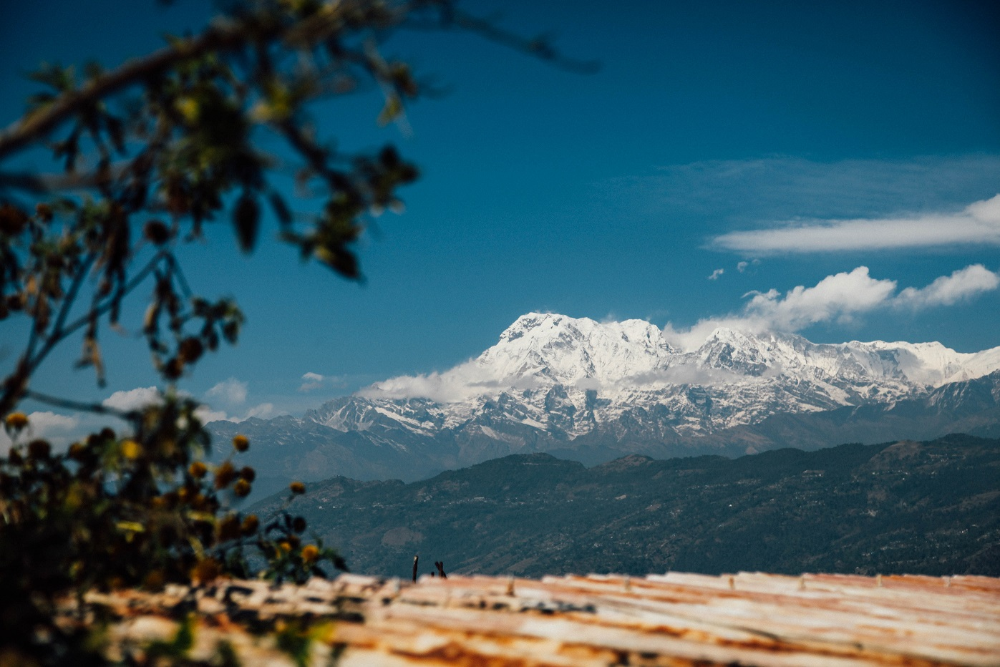

In [15]:
path = "/content/Nepal.jpg"
img = cv.imread(path)
cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

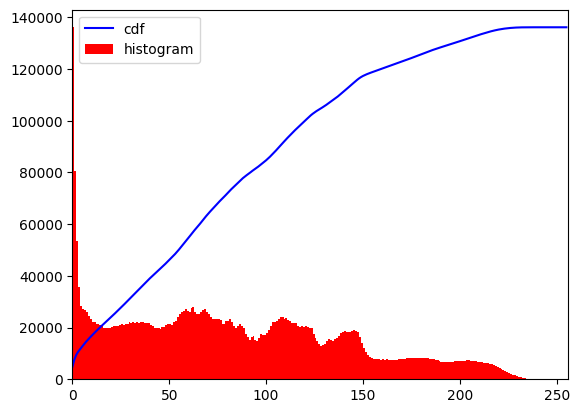

In [16]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

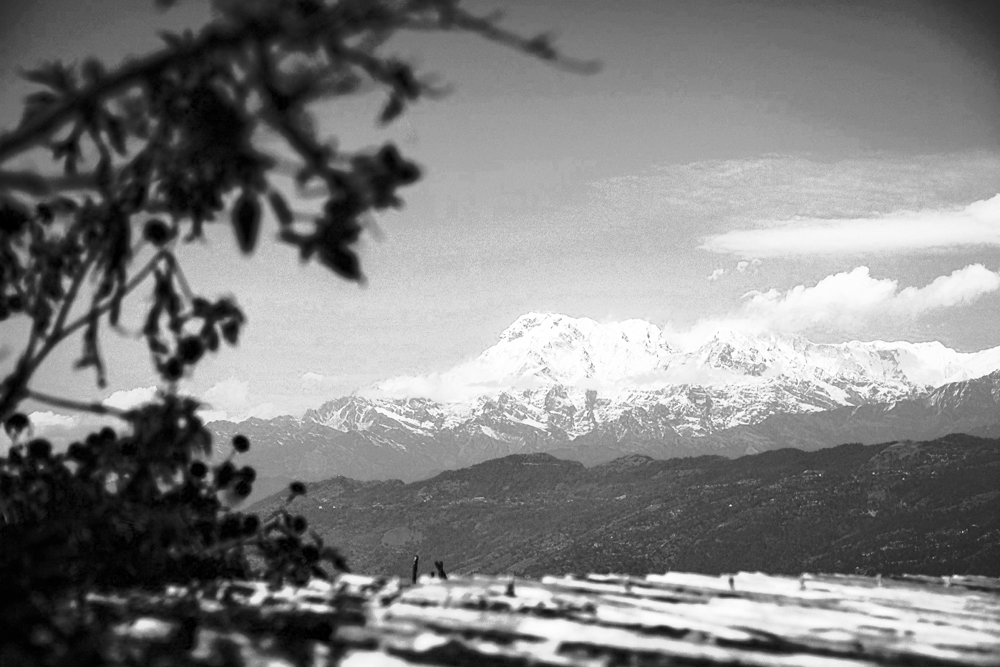

In [17]:
equ = cv.equalizeHist(img[:,:,0])
cv2_imshow(equ)
cv.waitKey(0)
cv.destroyAllWindows()

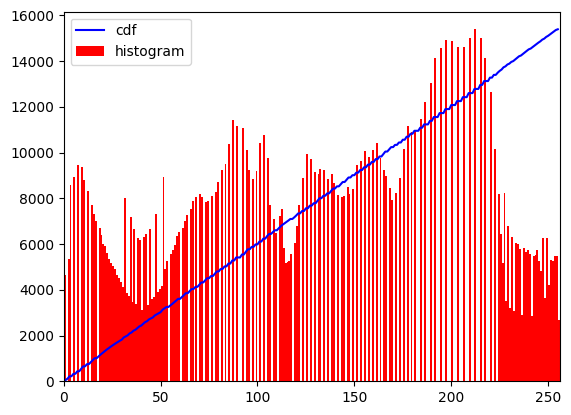

In [18]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

### eggs jpg file

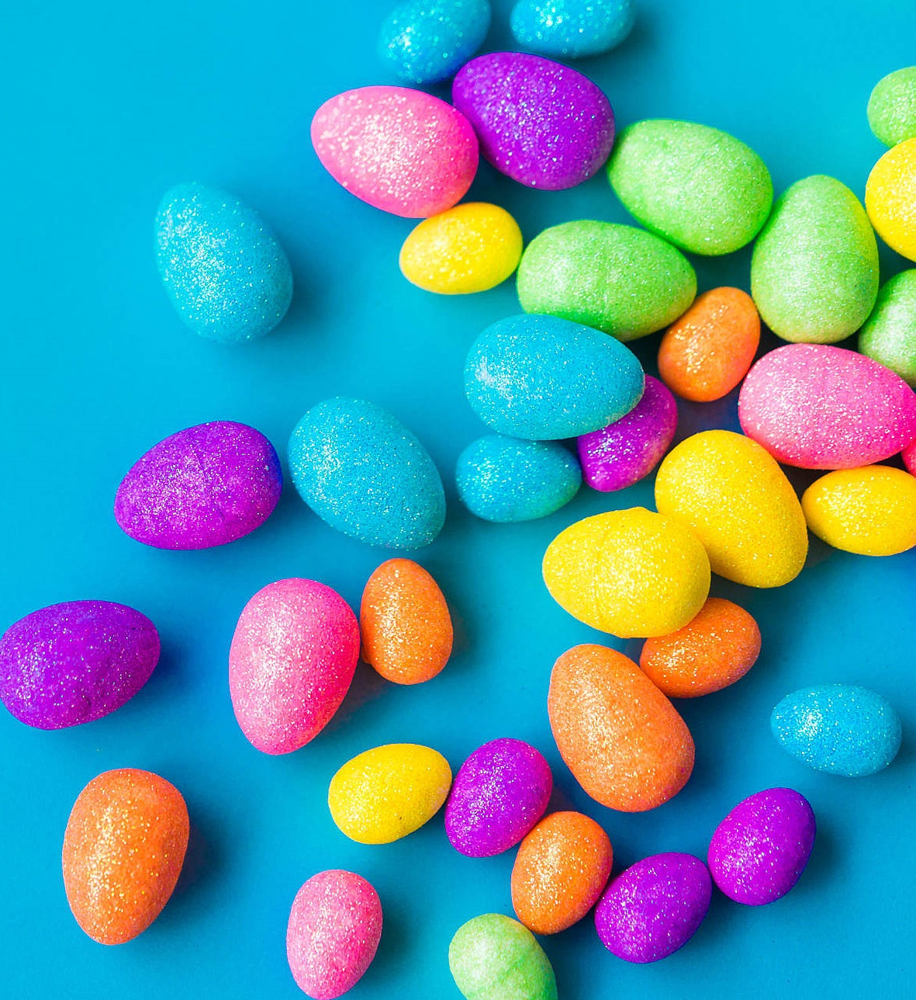

In [19]:
path = "/content/eggs.jpg"
img = cv.imread(path)
cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

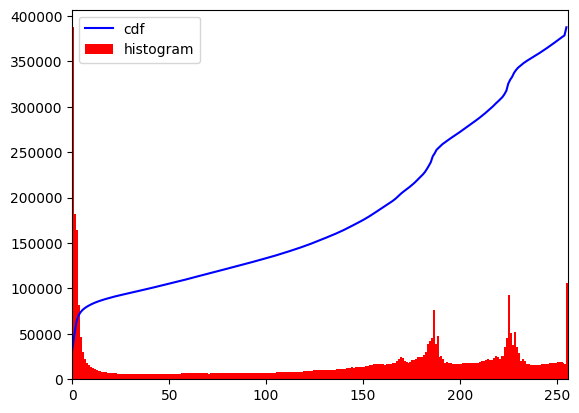

In [20]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

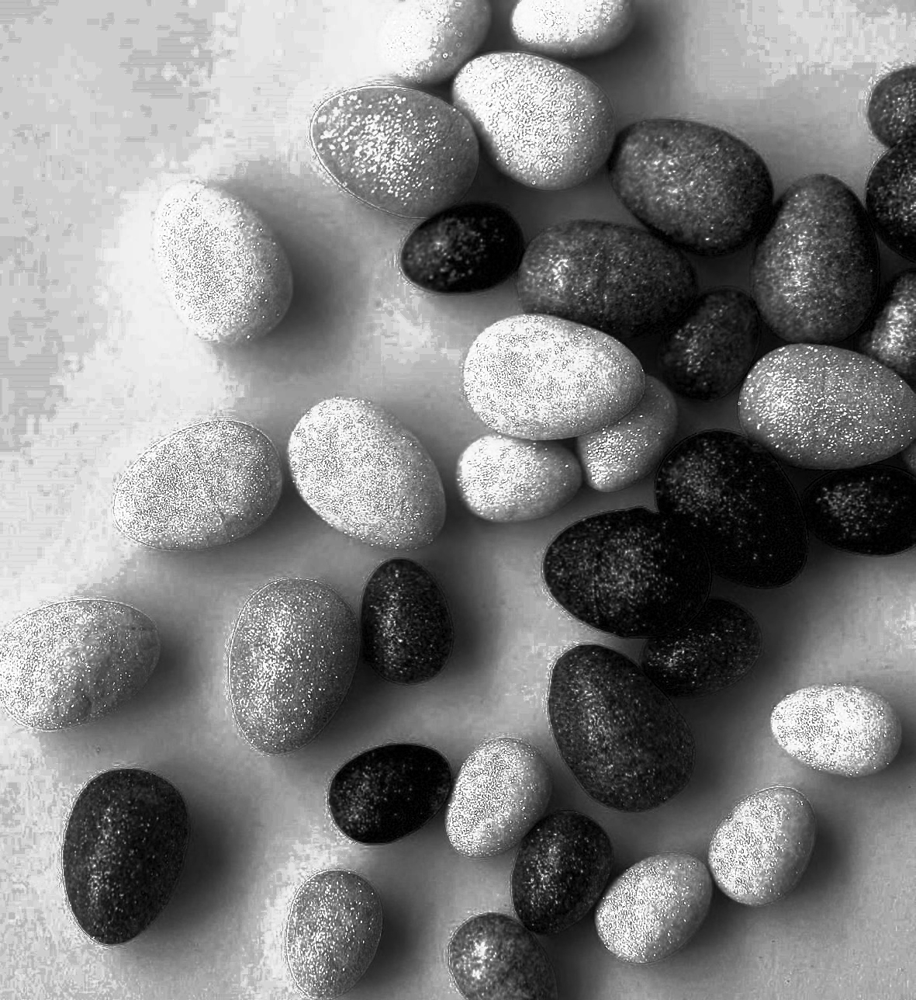

In [21]:
equ = cv.equalizeHist(img[:,:,0])
cv2_imshow(equ)
cv.waitKey(0)
cv.destroyAllWindows()

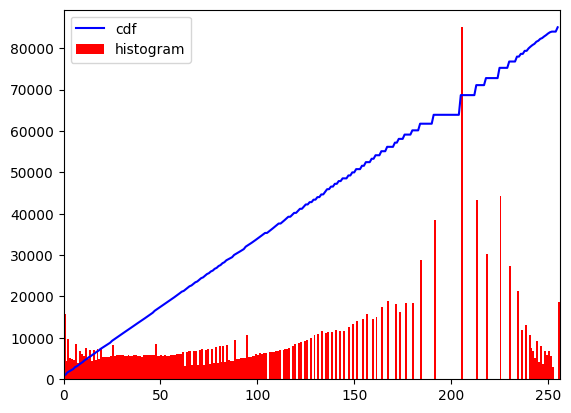

In [22]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

### boy jpg file

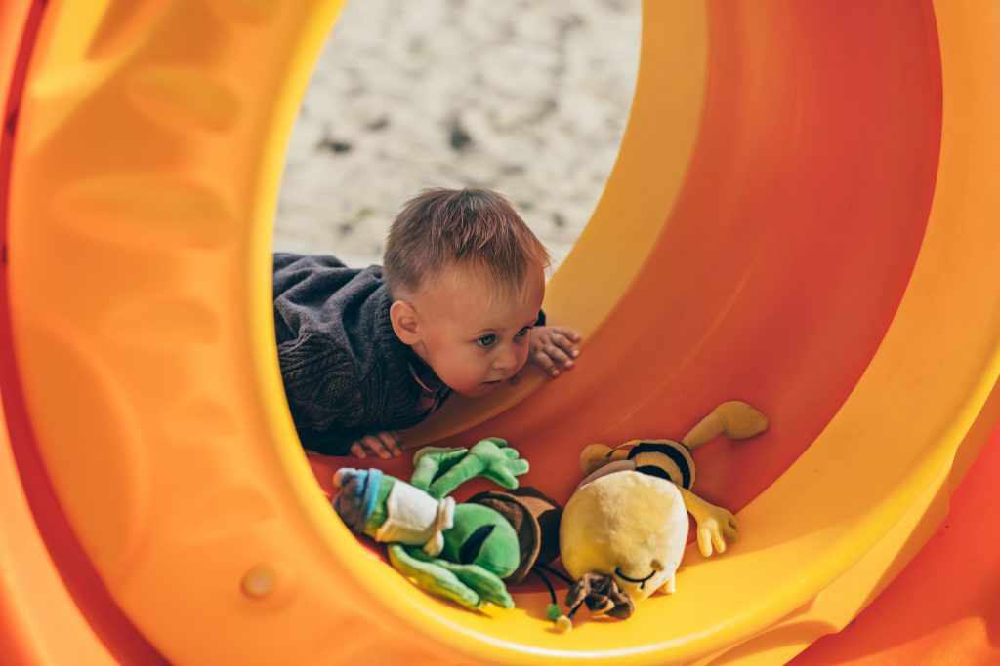

In [23]:
path = "/content/boy.jpg"
img = cv.imread(path)
cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

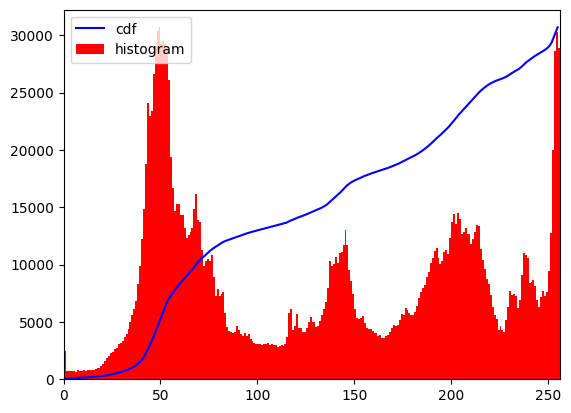

In [24]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

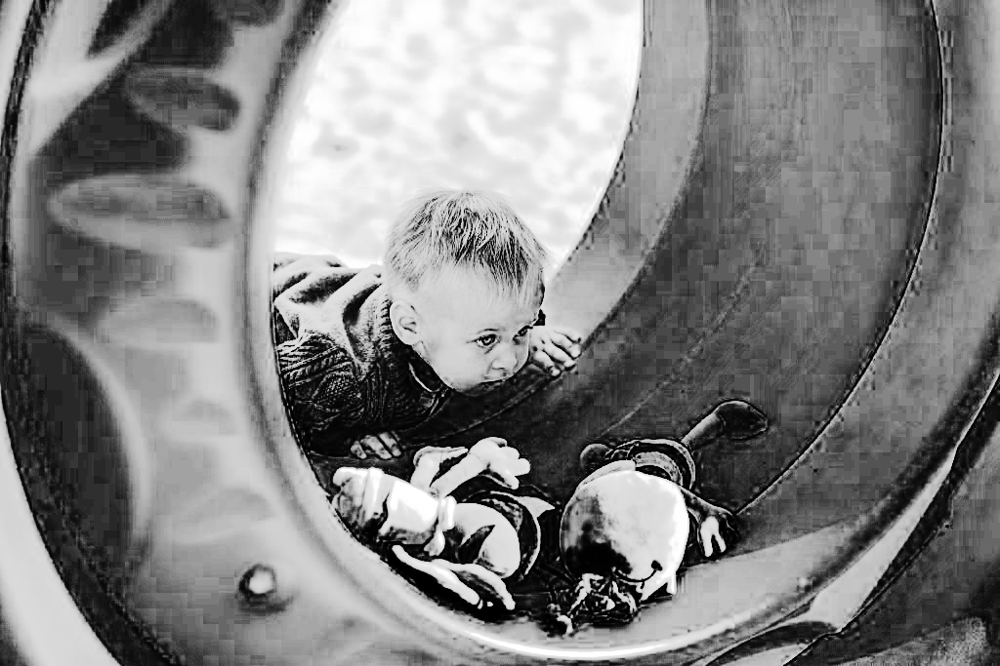

In [25]:
equ = cv.equalizeHist(img[:,:,0])
cv2_imshow(equ)
cv.waitKey(0)
cv.destroyAllWindows()

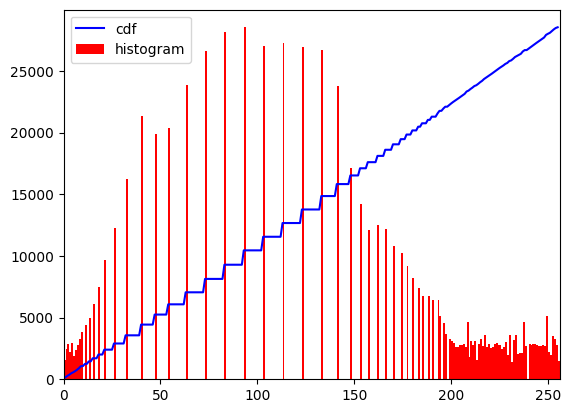

In [26]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

## Question 2. Why don't we apply histogram equalization on each color channel separately to implement histogram equalization on color images?


**Answer to Q2**:
There are various factors which we don't apply histogram equalization on each color channel.
1. We can loss color balance because each color image consists of different colors like red , green, blue etc.
2. Loss spatial correlation between the color images it can lead to distorted perception of the image.
3. We can get inconsistent contrast variation in the color images if we apply histogram equalization on each color channel.



## Task 3. Convert RGB image to Ycbcr from opencv

Use any rgb image and share it from your google drive as shareable link and use it here

In [27]:
# rgb image reading through path
ImageRgb = cv2.imread('/content/RGBfile.jpg')

# Transforming RGB image to Ycbcr
YcbcrImage = cv2.cvtColor(ImageRgb, cv2.COLOR_BGR2YCrCb)
YcbcrImage

array([[[197, 169,  18],
        [197, 169,  18],
        [197, 169,  18],
        ...,
        [ 58, 214,  96],
        [ 58, 214,  96],
        [ 58, 214,  96]],

       [[197, 169,  18],
        [197, 169,  18],
        [197, 169,  18],
        ...,
        [ 58, 214,  96],
        [ 58, 214,  96],
        [ 58, 214,  96]],

       [[196, 169,  18],
        [196, 169,  18],
        [196, 169,  18],
        ...,
        [ 58, 214,  96],
        [ 58, 214,  96],
        [ 58, 214,  96]],

       ...,

       [[145,  26, 139],
        [145,  26, 139],
        [145,  26, 139],
        ...,
        [ 73, 193, 204],
        [ 73, 193, 204],
        [ 73, 193, 204]],

       [[145,  26, 139],
        [145,  26, 139],
        [145,  26, 139],
        ...,
        [ 73, 193, 204],
        [ 73, 193, 204],
        [ 73, 193, 204]],

       [[145,  26, 139],
        [145,  26, 139],
        [145,  26, 139],
        ...,
        [ 73, 193, 204],
        [ 73, 193, 204],
        [ 73, 193, 204]]

## Task 4. Design code to implement Features from Accelerated Segment Test (FAST)

Keep your face image file name as **faceimg.jpg**
Save it in drive and use get shareable link to everyone option.

Please print the following during the implementation

* Original Image (faceimg.jpg)

* Gray Image (of original image)

* Number of Keypoints Detected In The Image With Non Max Suppression (Not just number image too)

* Number of Keypoints Detected In The Image Without Non Max Suppression (Not just number image too)


Actual Image:


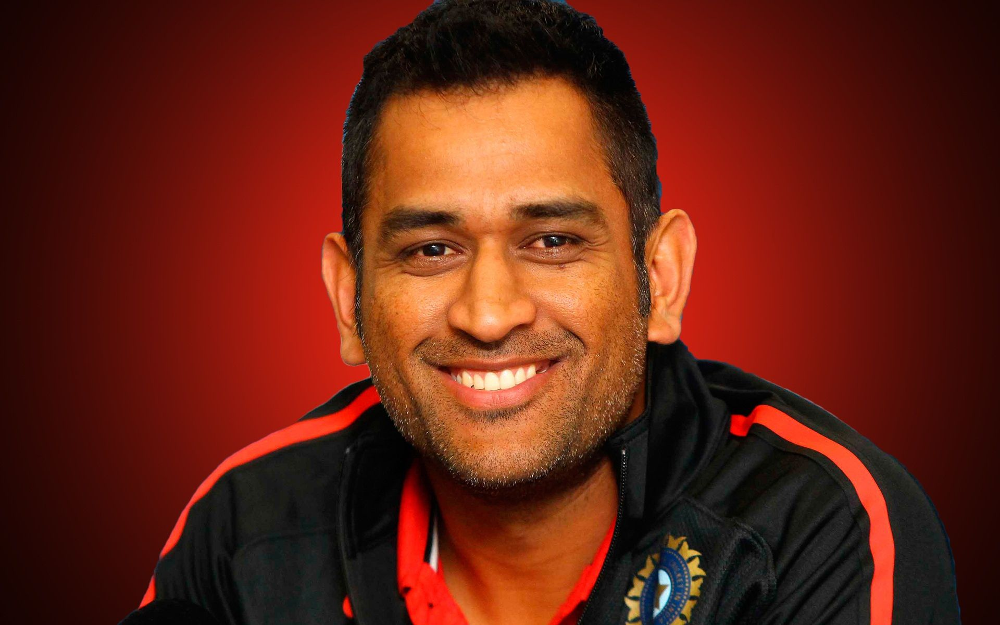

transformed gray image:


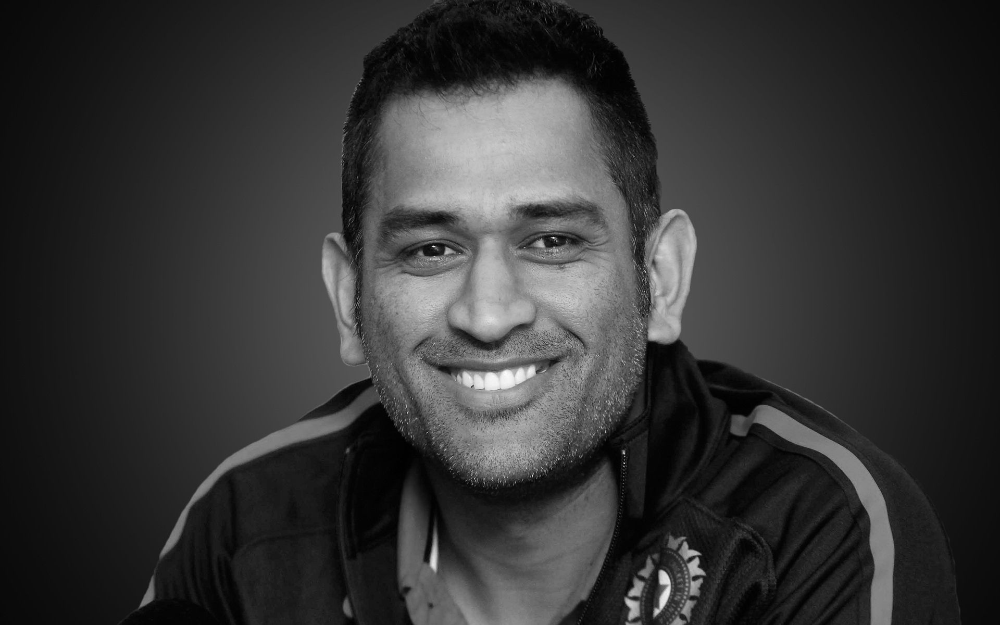

Detected keypoints using non max supervision: 14397
Detected keypoints using non max supervision: 45619


In [28]:
#code here
import cv2
from google.colab.patches import cv2_imshow
# reading the image
faimg= cv2.imread('/content/faceimagemsd.jpg')

# Transforming image to gray scale
grimg = cv2.cvtColor(faimg, cv2.COLOR_BGR2GRAY)

# Object creation for Fastfeature detector
fstdet = cv2.FastFeatureDetector_create()

# Genearing keypoints using nonmaxsupervision
Keypts_nonmx = fstdet.detect(grimg, None)

# Generating keypoints without nonmaxsupervision
fstdet.setNonmaxSuppression(False)
withoutmax = fstdet.detect(grimg, None)

# Displaying the original image
print("Actual Image:")
cv2_imshow(faimg)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Displaying the gray scale image
print("transformed gray image:")
cv2_imshow(grimg)
cv2.waitKey(0)
cv2.destroyAllWindows()

# printing keypoints with non max supervision
print("Detected keypoints using non max supervision:", len(Keypts_nonmx))

# printing keypoints without non max supervision
print("Detected keypoints using non max supervision:", len(withoutmax))


## Question 3. Difference between MPEG 4 and MPEG 7

**Answer to Q3**:
Difference between MPEG 4 and MPEG 7
1. MPEG 4 mainly focuses on the representation and compression of the multimedia content. It compress the audiovisual things like video streaming, video conferencing, and interactive multimedia services.

2. MPEG 7 focuses on the representation and description of the multimedia content. It provides descriptors and tools for the visual features, audio features, metadata, and annotations.


## Question 4.

Whats MPEG 21 ?

Whats the Purpose of MPEG 21 ?

Applications of MPEG 21?

**Answer to Q4**:
1. MPEG 21 developed by the Moving Picture Experts Group (MPEG) that defines a multimedia framework for the creation, delivery, and consumption of multimedia content. It provides tools for creation ,delivery, and management.

2. Purpose: Regardless of its format, platform, or network, MPEG-21 aims to enable the seamless integration of multiple multimedia services and components. It intends to make it easier for people to communicate multimedia material in a variety of settings and applications in a transparent and effective manner.

3. Applications: Multimedia metadata and annotation, Based on its descriptive data, such as keywords, tags, and semantic annotations, it enables effective indexing, search, and retrieval of multimedia content.
Mulimedia delivery and streaming is also application of MPEG21 .It enables adaptive streaming, content adaptation, and personalized content delivery based on user preferences and device capabilities.